# Esercizi 09 - Algoritmi genetici - Travelling Salesman Problem

<span style="color:blue">Il problema del commesso viaggiatore consiste nel trovare il percorso più breve tra $N$ città, visitandole tutte una sola volta e tornando alla città iniziale. Si tratta quindi di un problema di ottimizzazione.</span>

<span style="color:blue">Una possibile implementazione consiste nell'associare a ogni percorso possibile una permutazione delle città da visitare. Date le coordinate delle città, è possibile associare un funzionale costo ad ogni percorso, ad esempio la lunghezza totale del percorso. </span>

<span style="color:blue">Più formalmente, date le posizioni generiche delle città $\vec{c}_1, \vec{c}_2, \dots, \vec{c}_N$, un generico percorso sarà dato da $\vec{x}_1, \vec{x}_2, \dots, \vec{x}_N=\vec{c}_{P1}, \vec{c}_{P2}, \dots, \vec{c}_{PN}$ dove $P$ è una generica permutazione degli indici. Ho scelto di utilizzare il funzionale costo corrispondenete alla somma delle lunghezze dei singoli spostamenti, ovvero $L^{(1)}(\vec{x}_1, \vec{x}_2, \dots, \vec{x}_N)=\sum_{i=1}^{N}|\vec{x}_i-\vec{x}_{i+1}|$, dove l'indice $N+1$ si intende uguale a $1$.</span>

<span style="color:blue">Per risolvere il problema con $N$ città, si può fissare arbitrariamente la prima città senza perdere di generalità, riducendo così il problema a trovare l'ordine in cui visitare le rimanenti $N-1$ città.</span>


## Implementazione algoritmo genetico

La struttura del problema consente una intuitiva implementazione utilizzando un algoritmo genetico. Ogni percorso si può associare a un cromosoma, in cui ogni gene corrisponde a una città visitata. L'allele corrisponde all'indice permutato per un determinato percorso. Ad esempio, date $5$ città, due percorsi possibili sarebbero $[1,2,3,4,5]$ o $[4,3,2,5,1]$ (in realtà, date le considerazioni fatte prima $N$ geni possono rappresentare un percorso che passa per $N+1$ città). A ogni cromosoma è possibile associare una "fitness": più il percorso è breve, più il cromosoma è da considerarsi buono. <span style="color:red">Una funzione fitness si può ottenere banalmente consideranto l'inverso della lunghezza del percorso</span>. Avendo codificato il problema come descritto qui, il funzionamento dell'algoritmo genetico utilizzato per risolverlo sono del tutto generali: il funzionamento di selezione, mutazione e crossover sono del tutto generali e indipendenti dal problema specifico di ottimizzazione.

Data la vasta applicabilità degli algoritmi genetici, ho provato a programmare un algoritmo genetico che fosse il più generale possibile. Ho notato che, fondamentalmente, <span style="color:red">le uniche cose che dipendono dal problema da risolvere sono il tipo di dato degli alleli</span> (interi nel caso del TSP, ma nulla vieta di considerare double o qualsiasi altro tipo di oggetti) <span style="color:red">e la funzione costo</span> (la bontà di un cromosoma è strettamente legata allo specifico problema). Ho quindi implementato delle classi template per i cromosomi e per la popolazione (così da lasciare la possibilità di utilizzare uno specifico tipo di dato), utilizzando un metodo virtuale per il calcolo della fitness (che ovviamente deve essere implementata di volta in volta). La classe dei cromosomi contiene un vettore di tipo generico "T" come membro e diversi metodi corrispondenti ciascuno a una diversa possibile mutazione. La classe della popolazione, invece, contiene un vettore di cromosomi (contenenti un vettore di tipo generico "T") e le funzioni tipiche di un algoritmo genetico (seleziona, fai crossover, nuova generazione, ...).

Per risolvere uno specifico problema è sufficiente quindi creare una classe figlia per la popolazione specificando il tipo di dato degli alleli (interi), implementando la funzione per il calcolo della fitness (l'inverso della lunghezza del percorso) e inizializzando la popolazione di cromosomi come si vuole. Per l'inizializzazione ho inizialmente riempito ciascun cromosoma con gli interi corrispondenti a tutte le città e successivamente ho eseguito una serie di permutazioni a coppie ottenendo così una popolazioni di cromosomi casuali, ma soddisfacenti il vincolo sulla visita di tutte le città una e una sola volta. Quest'ultimo vincolo impone, infine, di reimplementare il crossover adeguatamente, in modo che ogni cromosoma abbia ciascun allele una e una sola volta.

Come ultima osservazione, ho trovato particolarmente comodo utilizzare <span style="color:red">i contenitori della STL</span>. Nello specifico, alla base di un cromosoma c'è un "vector" di dati di tipo "T", mentre una popolazione contiene un vector di cromosomi di tipo "T". Ho notato che questi, oltre ad essere particolarmente comodi per la gestione della memoria, <span style="color:red">hanno una serie di funzionalità "già pronte" che possono essere utilizzate direttamente per implementare degli operatori genetici</span>. Ad esempio, per fare un crossover normale (non quello specifico per il TSP) si può utilizzare la funzione "swap_ranges()", per dei generici scambi di geni si può utilizzare "swap()" e molte altre funzioni potrebbero costituire un'implementazione di una possibile mutazione. Infine, implementando un operatore "<" per i cromosomi è possibile sfruttare la funzione "sort()" per riordinare la popolazione in base alla fitness. 

Approcciando l'implementazione degli <span style="color:red">algoritmi genetici</span> in questo modo, è possibile apprezzare la loro estrema generalità:<span style="color:red"> possono</span> infatti <span style="color:red">essere utilizzati nelle situazioni più disparate con minime differenze di implementazione, le quali dipendono principalmente (e inevitabilmente) dalla specifica codifica adottata per il problema che si vuole risolvere</span>.

Per la selezione ho considerato l'algoritmo suggerito: avendo ordinato i cromosomi in base alla fitness, viene estratto un numero casuale $r \in [0,1)$ e viene selezionato il cromosoma $j=int(N \times r^p)$, dove $p>1$ è un parametro che si può regolare (se $p=1$ tutti ogni cromosoma ha la stessa probabilità di essere seleionato, più $p$ cresce più l'evoluzione diventa selettiva). Anche per le mutazioni e il crossover ho seguito le indicazioni. A ognuna delle 4 mutazioni introdotte ho assegnato la stessa probabilità di avvenire e ciascuna avviene indipendentemente dalle altre. Con "probabilità di mutazione indico la probabilità di avvenire di ciascuna mutazione. Questa è l'implementazione più semplice che consente di avere pochi parametri da regolare, si potrebbe anche assegnare ad ogni mutazione una probabilità diversa.

### Città su una circonferenza

Per verificare il buon funzionamento del codice ho considerato $N=32$ città su una circonferenza, per cui la soluzione è banale. In questa fase non mi sono preoccupato degli altri parametri riguardanti selezione, crossover e mutazioni, ho scelto arbitrariamente $p=2$. Come probabilità per il crossover ho scelto $p_{cross}=0.6$ e come probabilità di ciascuna mutazione $p_{mut}=0.05$

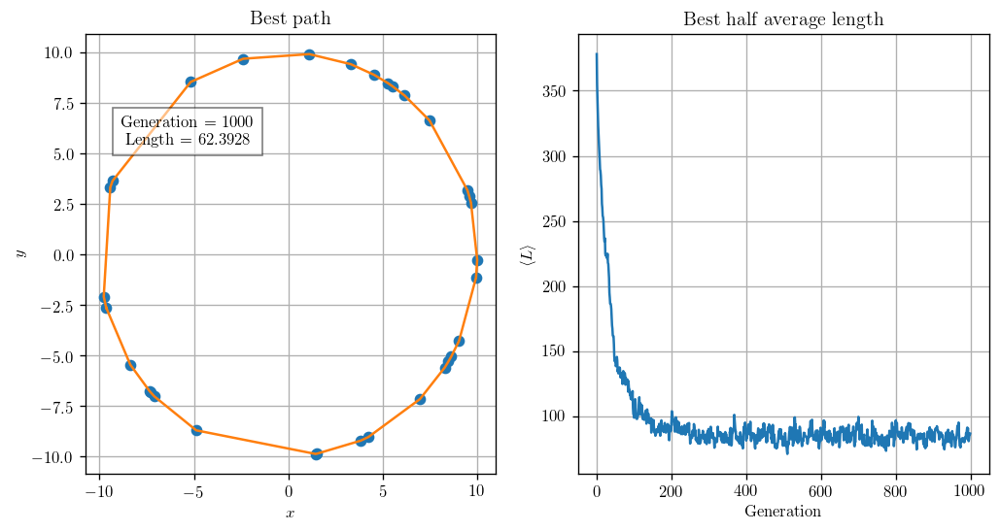

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

best_paths=np.loadtxt("Ex_09_1/Cycle/fittest.out", delimiter=", ", dtype="int")
best_paths_length=np.loadtxt("Ex_09_1/Cycle/best_length.out", delimiter=", ", dtype="float")
avg_besthalf_length=np.loadtxt("Ex_09_1/Cycle/path_length.out", delimiter=", ", dtype="float")

x,y=np.loadtxt("Ex_09_1/Cycle/coordinates.out", delimiter=",",unpack=True)

path_x=[ x[i] for i in best_paths[-1]] 
path_y=[ y[i] for i in best_paths[-1]] 


plt.rc('text', usetex=True)
plt.rc('font', family='serif')

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,5), dpi=120)

ax1.plot(x,y,marker="o",linestyle="none")
ax1.plot(path_x,path_y)
ax1.set_title("Best path")
ax1.set_xlabel("$x$")
ax1.set_ylabel("$y$")
ax1.grid()

ax2.plot(avg_besthalf_length)
ax2.set_title("Best half average length")
ax2.set_xlabel("Generation")
ax2.set_ylabel(r"$\langle L \rangle$")
ax2.grid()

text_box = ax1.text(0.25, 0.75, "", bbox={'facecolor': 'w', 'alpha': 0.5, 'pad': 5}, transform=ax1.transAxes, ha="center", fontfamily="serif")
text_box.set_text("Generation = " + str(len(best_paths_length))+ "\n Length = "+str(best_paths_length[-1]))

plt.show()


Si può osservare che l'algoritmo ha trovato la soluzione migliore. In particolare, nel grafico a destra, si nota che la media delle lunghezze della metà migliore dei percorsi si stabilizza già dopo circa 200 generazioni. La lunghezza di una circonferenza di raggio $10$ sarebbe $L=2\pi R\approx 62.83$, un valore effettivamente confrontabile con quello trovato (ovviamente considerando un numero finito di punti la lunghezza del percorso è minore della lunghezza della circonferenza).

### Città in un quadrato

Avendo testato il buon funzionamento dell'algoritmo su un caso noto, ho studiato il caso più complicato delle città disposte casualmente in un quadrato di lato $10$. Riporto subito i risultati otttenuti con gli stessi parameteri utilizzati nel paragrafo sopra.

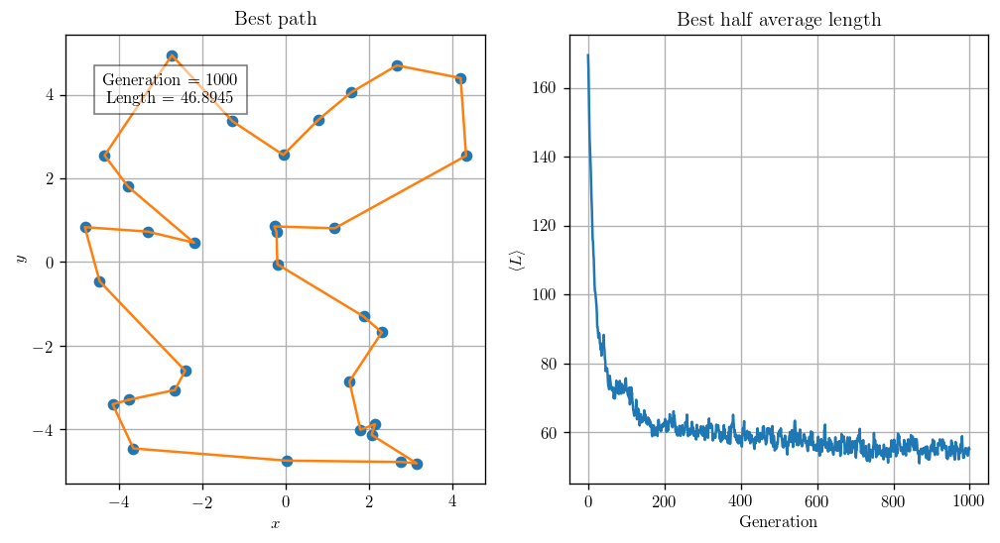

In [2]:
best_paths=np.loadtxt("Ex_09_1/Square/fittest.out", delimiter=", ", dtype="int")
best_paths_length=np.loadtxt("Ex_09_1/Square/best_length.out", delimiter=", ", dtype="float")
avg_besthalf_length=np.loadtxt("Ex_09_1/Square/path_length.out", delimiter=", ", dtype="float")

x,y=np.loadtxt("Ex_09_1/Square/coordinates.out", delimiter=",",unpack=True)

path_x=[ x[i] for i in best_paths[-1]] 
path_y=[ y[i] for i in best_paths[-1]] 


plt.rc('text', usetex=True)
plt.rc('font', family='serif')

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,5), dpi=120)

ax1.plot(x,y,marker="o",linestyle="none")
ln1, = ax1.plot(path_x,path_y, animated=True)
ax1.set_title("Best path")
ax1.set_xlabel("$x$")
ax1.set_ylabel("$y$")
ax1.grid()

ln2, = ax2.plot(avg_besthalf_length,animated=True)
ax2.set_title("Best half average length")
ax2.set_xlabel("Generation")
ax2.set_ylabel(r"$\langle L \rangle$")
ax2.grid()

text_box = ax1.text(0.25, 0.85, "", bbox={'facecolor': 'w', 'alpha': 0.5, 'pad': 5}, transform=ax1.transAxes, ha="center", fontfamily="serif")
text_box.set_text("Generation = " + str(len(best_paths_length))+ "\n Length = "+str(best_paths_length[-1]))

plt.show()


Riporto anche un'animazione che mostra l'evoluzione dell'algoritmo genetico con il numero di generazioni. Si può notare che <span style="color:red">all'inizio il percorso migliora velocemente, mente con l'aumentare delle generazioni vengono fatte solo delle "rifiniture", ovvero piccoli cambiamenti del percorso</span>.

In [3]:
from matplotlib import animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
    
path_x=[ x[i] for i in best_paths[0]] 
path_y=[ y[i] for i in best_paths[0]]
generations=np.arange(0,1000,1)

ln1.set_data(path_x, path_y)
ln2.set_data(generations[:0], avg_besthalf_length[:0])        

def update(t):
    
    path_x=[ x[i] for i in best_paths[t]] 
    path_y=[ y[i] for i in best_paths[t]]

    ln1.set_data(path_x, path_y)
    ln2.set_data(generations[:t], avg_besthalf_length[:t])

    text_box.set_text("Generation = " + str(t)+ "\n Length = "+str(best_paths_length[t]))

    return ln1, ln2, text_box

ani = FuncAnimation(fig, update, frames=np.arange(0,1000,10),
                     repeat=False, interval=120)
plt.rcParams['animation.embed_limit'] = 2**128 #limite alla dimensione dell'animazione
plt.rcParams["animation.html"] = "jshtml"
ani
#HTML(ani.to_html5_video())


Avendo appurato che i parametri scelti "a caso" sono buoni, ho provato a modificare i diversi parametri in gioco per vedere come cambiano i risultati.

Ho cominciato regolando il parametro $p$ che regola la **selezione**, lasciando fissate le probabilità di mutazione e di crossover ($p_{mut}=0.05$ e $p_{cross}=0.6$).

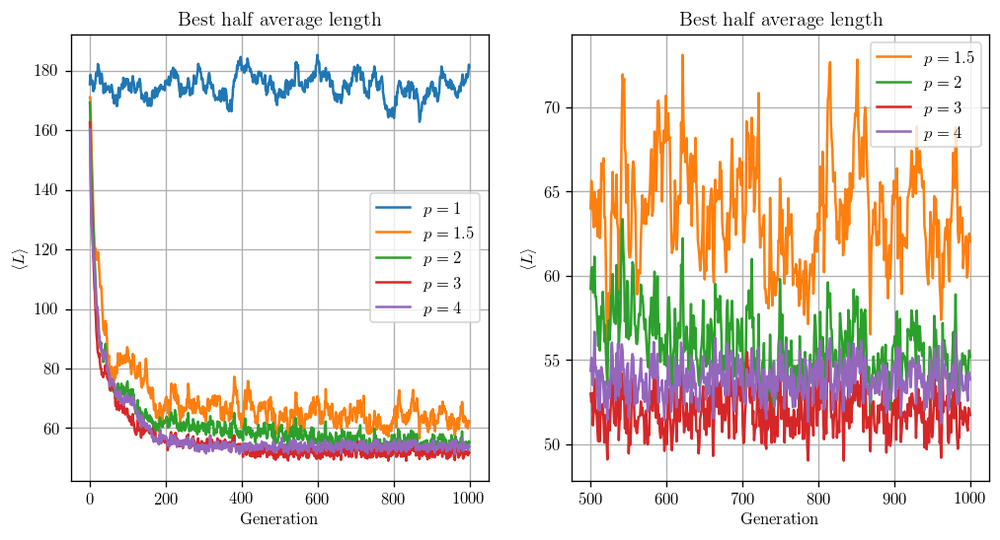

In [4]:
avg_path_length_1=np.loadtxt("Ex_09_1/Square/Selection/path_length_1.out", delimiter=", ", dtype="float")
avg_path_length_1_5=np.loadtxt("Ex_09_1/Square/Selection/path_length_1.5.out", delimiter=", ", dtype="float")
avg_path_length_2=np.loadtxt("Ex_09_1/Square/Selection/path_length_2.out", delimiter=", ", dtype="float")
avg_path_length_3=np.loadtxt("Ex_09_1/Square/Selection/path_length_3.out", delimiter=", ", dtype="float")
avg_path_length_4=np.loadtxt("Ex_09_1/Square/Selection/path_length_4.out", delimiter=", ", dtype="float")

x,y=np.loadtxt("Ex_09_1/Square/coordinates.out", delimiter=",",unpack=True)

path_x=[ x[i] for i in best_paths[-1]] 
path_y=[ y[i] for i in best_paths[-1]] 


plt.rc('text', usetex=True)
plt.rc('font', family='serif')

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,5), dpi=120)

ax1.plot(avg_path_length_1,label=r"$p=1$")
ax1.plot(avg_path_length_1_5,label=r"$p=1.5$")
ax1.plot(avg_path_length_2,label=r"$p=2$")
ax1.plot(avg_path_length_3, label=r"$p=3$")
ax1.plot(avg_path_length_4,label=r"$p=4$")
ax1.legend()
ax1.set_title("Best half average length")
ax1.set_xlabel("Generation")
ax1.set_ylabel(r"$\langle L \rangle$")
ax1.grid()


ax2.plot(generations[500:], avg_path_length_1_5[500:],label=r"$p=1.5$", color="C1")
ax2.plot(generations[500:], avg_path_length_2[500:],label=r"$p=2$", color="C2")
ax2.plot(generations[500:], avg_path_length_3[500:],label=r"$p=3$", color="C3")
ax2.plot(generations[500:], avg_path_length_4[500:],label=r"$p=4$", color="C4")
ax2.legend()
ax2.set_title("Best half average length")
ax2.set_xlabel("Generation")
ax2.set_ylabel(r"$\langle L \rangle$")
ax2.grid()


plt.show()


Nei grafici sono è riportata la lunghezza media della metà dei percorsi migliori al crescere del numero di generazioni. Il grafico a destra è semplicemente uno "zoom" delle ultime $500$ generazioni.
Si può notare che effettivamente per $p=1$ non c'è alcuna selezione. Inoltre, sembra esserci un valore ottimale per $p$, cioè $p=3$ (la curva rossa oscilla attorno a valori leggermente inferiori rispetto alle altre). In effetti, <span style="color:red">un'evoluzione poco selettiva potrebbe impiegare tanto tempo ad arrivare a una buona popolazione, ma un'evoluzione troppo selettiva potrebbe ridurre la diversità impedendo quindi eventuali miglioramenti</span> (che magari corrisponderebbero a configurazioni lontane da quella su cui si è fissata la popolazione).

Per le prossime ottimizzazioni ho quindi considerato $p=3$.

Ho poi provato a regolare la probabilità di mutazione, lasciando fissate le altre due quantità ($p=3$ e $p_{cross}=0.6$)

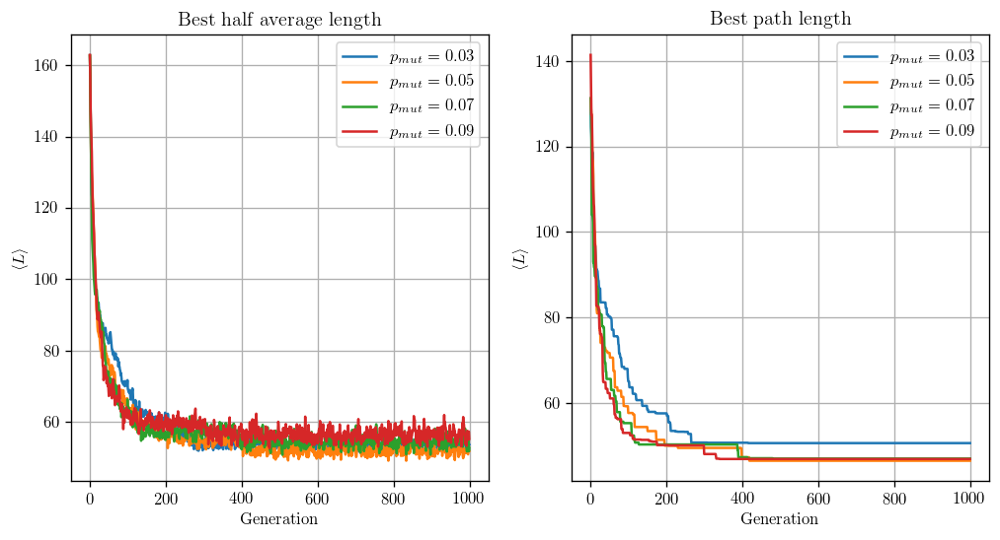

Best path p=0.03:  50.5003
Best path p=0.05:  46.3666
Best path p=0.07:  46.8713
Best path p=0.09:  46.7713


In [5]:
avg_path_length_003=np.loadtxt("Ex_09_1/Square/Mutation/path_length_003.out", delimiter=", ", dtype="float")
avg_path_length_005=np.loadtxt("Ex_09_1/Square/Mutation/path_length_005.out", delimiter=", ", dtype="float")
avg_path_length_007=np.loadtxt("Ex_09_1/Square/Mutation/path_length_007.out", delimiter=", ", dtype="float")
avg_path_length_009=np.loadtxt("Ex_09_1/Square/Mutation/path_length_009.out", delimiter=", ", dtype="float")
best_path_length_003=np.loadtxt("Ex_09_1/Square/Mutation/best_length_003.out", delimiter=", ", dtype="float")
best_path_length_005=np.loadtxt("Ex_09_1/Square/Mutation/best_length_005.out", delimiter=", ", dtype="float")
best_path_length_007=np.loadtxt("Ex_09_1/Square/Mutation/best_length_007.out", delimiter=", ", dtype="float")
best_path_length_009=np.loadtxt("Ex_09_1/Square/Mutation/best_length_009.out", delimiter=", ", dtype="float")

x,y=np.loadtxt("Ex_09_1/Square/coordinates.out", delimiter=",",unpack=True)

path_x=[ x[i] for i in best_paths[-1]] 
path_y=[ y[i] for i in best_paths[-1]] 


plt.rc('text', usetex=True)
plt.rc('font', family='serif')

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,5), dpi=120)

ax1.plot(avg_path_length_003,label=r"$p_{mut}=0.03$")
ax1.plot(avg_path_length_005,label=r"$p_{mut}=0.05$")
ax1.plot(avg_path_length_007,label=r"$p_{mut}=0.07$")
ax1.plot(avg_path_length_009, label=r"$p_{mut}=0.09$")
ax1.legend()
ax1.set_title("Best half average length")
ax1.set_xlabel("Generation")
ax1.set_ylabel(r"$\langle L \rangle$")
ax1.grid()


ax2.plot(best_path_length_003,label=r"$p_{mut}=0.03$")
ax2.plot(best_path_length_005,label=r"$p_{mut}=0.05$")
ax2.plot(best_path_length_007,label=r"$p_{mut}=0.07$")
ax2.plot(best_path_length_009, label=r"$p_{mut}=0.09$")
ax2.legend()
ax2.set_title("Best path length")
ax2.set_xlabel("Generation")
ax2.set_ylabel(r"$\langle L \rangle$")
ax2.grid()

plt.show()
print("Best path p=0.03: ", best_path_length_003[-1])
print("Best path p=0.05: ", best_path_length_005[-1])
print("Best path p=0.07: ", best_path_length_007[-1])
print("Best path p=0.09: ", best_path_length_009[-1])


Anche la probabilità di mutazione sembra ammettere un minimo per <span style="color:red">la lunghezza media. Le mutazioni in generale sono "distruttive", nel senso che peggiorano la fitness di una popolazione. Tuttavia, esse consentono di esplorare un numero maggiore di configurazioni, mantenendo la ricerca "ergodica"</span>. La regolazione di questo *tradeoff* è ovviamente molto delicata. Nel grafico a destra ho quindi riportato soltanto l'evoluzione del migliore percorso, invece della media delle lunghezze della metà dei percorsi migliori. Si può notare che per $p=0.03$ il sistema interrompe l'evoluzione troppo presto. Gli altri valori sono invece appaiati e non sembra esserci una significativa differenza. Si può anche notare che tutti e tre i valori sono migliori di quello ottenuto inizialmente $L=46.8945$. Per continuare ho mantenuto $p_{mut}=0.05$.

Ho quindi provato a vedere cosa succede cambiando la probabilità di **crossover** ma tenendo fissati $p_{mut}=0.05$ e $p=3$.

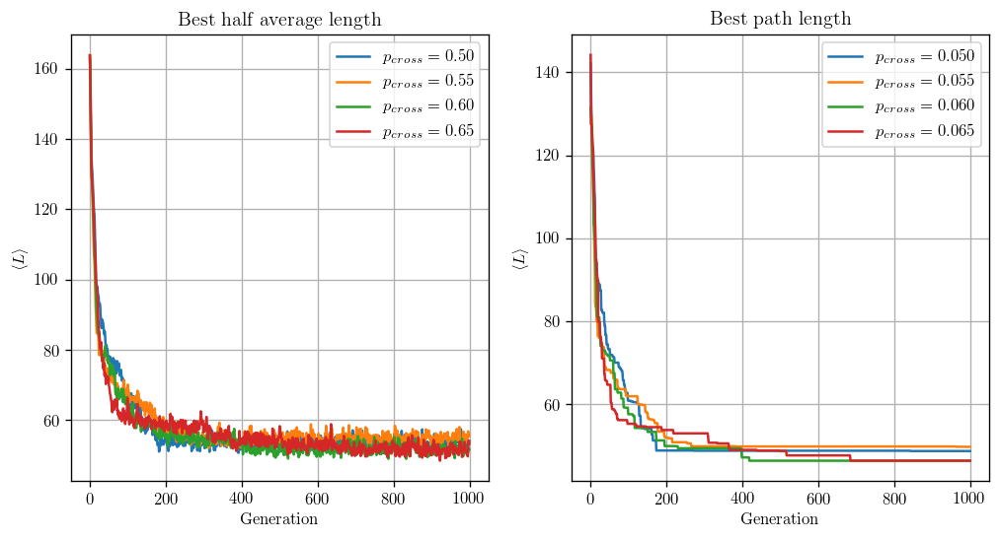

Best path p=0.50:  48.7028
Best path p=0.55:  49.7226
Best path p=0.60:  46.3666
Best path p=0.65:  46.3666


In [6]:
avg_path_length_050=np.loadtxt("Ex_09_1/Square/Crossover/path_length_050.out", delimiter=", ", dtype="float")
avg_path_length_055=np.loadtxt("Ex_09_1/Square/Crossover/path_length_055.out", delimiter=", ", dtype="float")
avg_path_length_060=np.loadtxt("Ex_09_1/Square/Crossover/path_length_060.out", delimiter=", ", dtype="float")
avg_path_length_065=np.loadtxt("Ex_09_1/Square/Crossover/path_length_065.out", delimiter=", ", dtype="float")

best_path_length_050=np.loadtxt("Ex_09_1/Square/Crossover/best_length_050.out", delimiter=", ", dtype="float")
best_path_length_055=np.loadtxt("Ex_09_1/Square/Crossover/best_length_055.out", delimiter=", ", dtype="float")
best_path_length_060=np.loadtxt("Ex_09_1/Square/Crossover/best_length_060.out", delimiter=", ", dtype="float")
best_path_length_065=np.loadtxt("Ex_09_1/Square/Crossover/best_length_065.out", delimiter=", ", dtype="float")


x,y=np.loadtxt("Ex_09_1/Square/coordinates.out", delimiter=",",unpack=True)

path_x=[ x[i] for i in best_paths[-1]] 
path_y=[ y[i] for i in best_paths[-1]] 


plt.rc('text', usetex=True)
plt.rc('font', family='serif')

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,5), dpi=120)

ax1.plot(avg_path_length_050,label=r"$p_{cross}=0.50$")
ax1.plot(avg_path_length_055,label=r"$p_{cross}=0.55$")
ax1.plot(avg_path_length_060,label=r"$p_{cross}=0.60$")
ax1.plot(avg_path_length_065, label=r"$p_{cross}=0.65$")
ax1.legend()
ax1.set_title("Best half average length")
ax1.set_xlabel("Generation")
ax1.set_ylabel(r"$\langle L \rangle$")
ax1.grid()


ax2.plot(best_path_length_050,label=r"$p_{cross}=0.050$")
ax2.plot(best_path_length_055,label=r"$p_{cross}=0.055$")
ax2.plot(best_path_length_060,label=r"$p_{cross}=0.060$")
ax2.plot(best_path_length_065, label=r"$p_{cross}=0.065$")
ax2.legend()
ax2.set_title("Best path length")
ax2.set_xlabel("Generation")
ax2.set_ylabel(r"$\langle L \rangle$")
ax2.grid()


plt.show()

print("Best path p=0.50: ", best_path_length_050[-1])
print("Best path p=0.55: ", best_path_length_055[-1])
print("Best path p=0.60: ", best_path_length_060[-1])
print("Best path p=0.65: ", best_path_length_065[-1])

Anche in questo caso valgono le stesse considerazioni fatte per le mutazioni circa il <span style="color:red">tradeoff tra ergodicità e convergenza della ricerca</span>. Il valore scelto inizialmente per la probabilità di crossover si è rivelato effettivamente buono.

Ho quindi rieseguito l'evoluzione fatta inizialmente utilizzando i nuovi parametri (in realtà è stato modificato solo $p=3$ invece di $p=2$) e lasciando evolvere il sistema per $10000$ generazioni invece di $1000$.

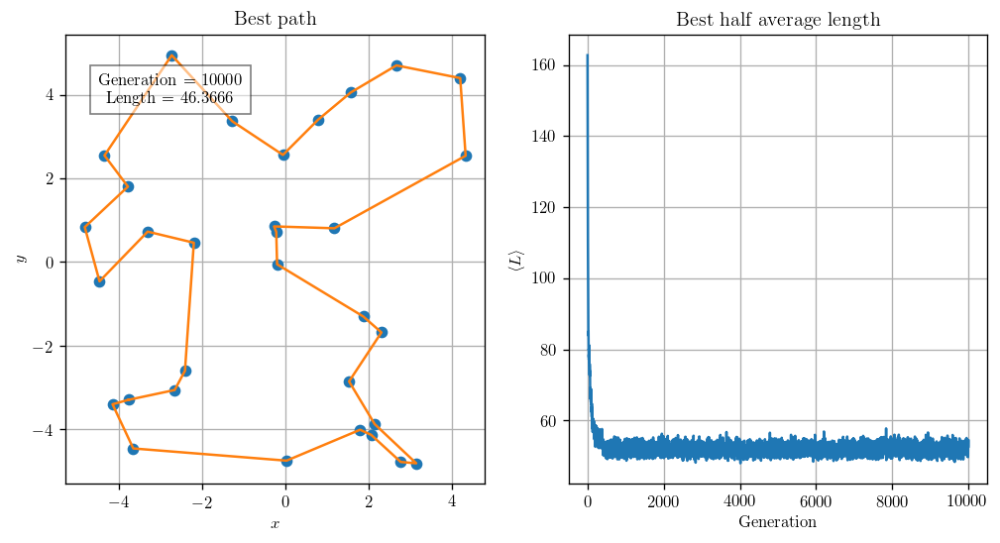

In [7]:
best_paths=np.loadtxt("Ex_09_1/Square/OptimizedRun/fittest.out", delimiter=", ", dtype="int")
best_paths_length=np.loadtxt("Ex_09_1/Square/OptimizedRun/best_length.out", delimiter=", ", dtype="float")
avg_besthalf_length=np.loadtxt("Ex_09_1/Square/OptimizedRun/path_length.out", delimiter=", ", dtype="float")


path_x=[ x[i] for i in best_paths[-1]] 
path_y=[ y[i] for i in best_paths[-1]] 


plt.rc('text', usetex=True)
plt.rc('font', family='serif')

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,5), dpi=120)

ax1.plot(x,y,marker="o",linestyle="none")
ln1, = ax1.plot(path_x,path_y, animated=True)
ax1.set_title("Best path")
ax1.set_xlabel("$x$")
ax1.set_ylabel("$y$")
ax1.grid()

ln2, = ax2.plot(avg_besthalf_length,animated=True)
ax2.set_title("Best half average length")
ax2.set_xlabel("Generation")
ax2.set_ylabel(r"$\langle L \rangle$")
ax2.grid()

text_box = ax1.text(0.25, 0.85, "", bbox={'facecolor': 'w', 'alpha': 0.5, 'pad': 5}, transform=ax1.transAxes, ha="center", fontfamily="serif")
text_box.set_text("Generation = " + str(len(best_paths_length))+ "\n Length = "+str(best_paths_length[-1]))

plt.show()


L'algoritmo è riuscito a trovare un percorso migliore di quello iniziale. È possibile anche osservare che non erano necessario $10000$ generazioni: la lunghezza finale era già stata raggiunta dopo $1000$ (come riportato nei grafici precedenti)

L'ultimo aspetto da considerare è il seguente: <span style="color:red">è possibile ottenere una "buona" evoluzione senza crossover, eventualmente aumentando la probabilità di mutazione?</span> Ho provato a vedere cosa succede settando $p_{cross}=0$.

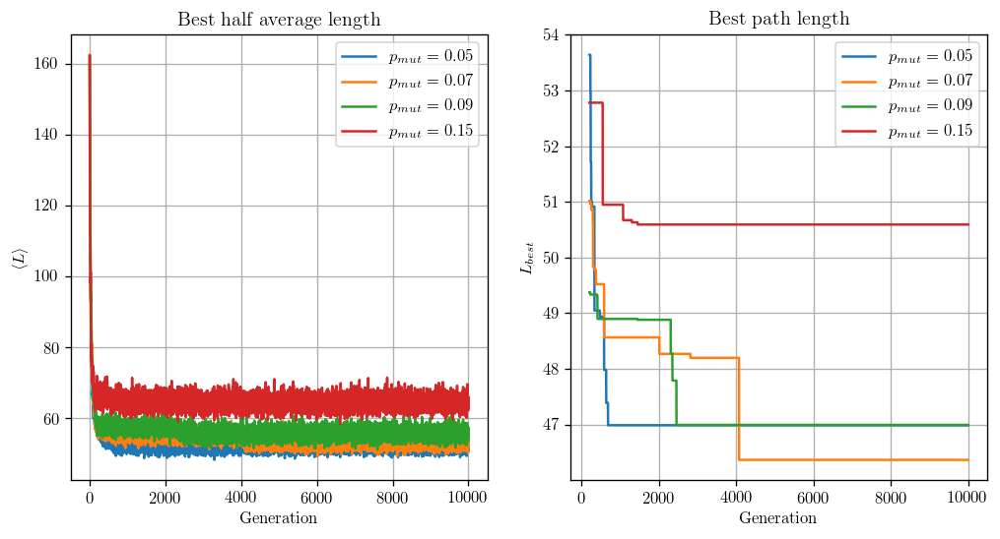

Best path p=0.05:  46.9884
Best path p=0.07:  46.3666
Best path p=0.09:  46.9945
Best path p=0.06:  50.5917


In [8]:
avg_path_length_005=np.loadtxt("Ex_09_1/Square/NOCrossover/path_length_005.out", delimiter=", ", dtype="float")
avg_path_length_007=np.loadtxt("Ex_09_1/Square/NOCrossover/path_length_007.out", delimiter=", ", dtype="float")
avg_path_length_009=np.loadtxt("Ex_09_1/Square/NOCrossover/path_length_009.out", delimiter=", ", dtype="float")
avg_path_length_015=np.loadtxt("Ex_09_1/Square/NOCrossover/path_length_015.out", delimiter=", ", dtype="float")

best_path_length_005=np.loadtxt("Ex_09_1/Square/NOCrossover/best_length_005.out", delimiter=", ", dtype="float")
best_path_length_007=np.loadtxt("Ex_09_1/Square/NOCrossover/best_length_007.out", delimiter=", ", dtype="float")
best_path_length_009=np.loadtxt("Ex_09_1/Square/NOCrossover/best_length_009.out", delimiter=", ", dtype="float")
best_path_length_015=np.loadtxt("Ex_09_1/Square/NOCrossover/best_length_015.out", delimiter=", ", dtype="float")

x,y=np.loadtxt("Ex_09_1/Square/coordinates.out", delimiter=",",unpack=True)

path_x=[ x[i] for i in best_paths[-1]] 
path_y=[ y[i] for i in best_paths[-1]] 


plt.rc('text', usetex=True)
plt.rc('font', family='serif')

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,5), dpi=120)

ax1.plot(avg_path_length_005,label=r"$p_{mut}=0.05$")
ax1.plot(avg_path_length_007,label=r"$p_{mut}=0.07$")
ax1.plot(avg_path_length_009, label=r"$p_{mut}=0.09$")
ax1.plot(avg_path_length_015,label=r"$p_{mut}=0.15$")
ax1.legend()
ax1.set_title("Best half average length")
ax1.set_xlabel("Generation")
ax1.set_ylabel(r"$\langle L \rangle$")
ax1.grid()


generations10000=np.arange(0,10000,1)
ax2.plot(generations10000[200:],best_path_length_005[200:],label=r"$p_{mut}=0.05$")
ax2.plot(generations10000[200:],best_path_length_007[200:],label=r"$p_{mut}=0.07$")
ax2.plot(generations10000[200:],best_path_length_009[200:], label=r"$p_{mut}=0.09$")
ax2.plot(generations10000[200:],best_path_length_015[200:],label=r"$p_{mut}=0.15$")
ax2.legend()
ax2.set_title("Best path length")
ax2.set_xlabel("Generation")
ax2.set_ylabel(r"$L_{best}$")
ax2.grid()

plt.show()
print("Best path p=0.05: ", best_path_length_005[-1])
print("Best path p=0.07: ", best_path_length_007[-1])
print("Best path p=0.09: ", best_path_length_009[-1])
print("Best path p=0.06: ", best_path_length_015[-1])



In questo caso, per alcuni valori di $p$, si riesce comunque ad arrivare a una buona soluzione. Ciononostante, vi si arriva molto dopo rispetto al caso con il crossover: dal grafico a destra si nota che per $p=0.07$ e $p=0.09$ si arriva a un buon valore per la lunghezza soltanto dopo 4000 e 2000 generazioni, mentre  con il crossover bastavano meno di 1000 generazioni (si veda l'analisi fatta prima cambiando il valore di $p_{mut}$). Se si cerca di aumentare l'ergodicità del sistema aumentando la probabilità di mutazione (caso $p=0.15$), le mutazioni diventano troppo distruttive e non si arriva neanche vicino alla soluzione iniziale. <span style="color:red">Per questo problema specifico, dunque, il crossover sembrerebbe non essere strettamente necessario, ma risulta comunque molto utile</span>.